# Extreme Heat in Los Angeles 
The City of Los Angeles has experienced a record breaking heatwave in the summer of 2022. This caused an increase in heat related illness, power shutoffs, and extended prolonged exposure to sweltering temperatures up to 115 degrees fahrenheit in some areas. After this event, questions were raised on how the most vulnerable communities will be able to combat climate change, specifically heat waves. Our group will first identify which areas within the City of Los Angeles will experience increased heat days above 90F between the years 2035 and 2064. These projections will help understand which communities will be impacted the most and if they are prepared in terms of emergency response center, cooling centers, and transit shelters. We aim to understand what communties have these three essential resources and the demographics of those communities that will be impacted the most in the future by current projection data provided by the California Healthy Places Index.

In [1]:
# to download osm data
import osmnx as ox

# to manipulate data
import pandas as pd

# for interactive plots
import plotly.express as px

# to manipulate and visualize spatial data
import geopandas as gpd

# to provide basemaps 
import contextily as ctx

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

#folium map 
import folium 
import json
import numpy as np

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
#Data Set for heat days above 90F in LA County
heat=pd.read_csv('Heat_W7.csv',
    dtype=
    {'FIPS':str,
     'GEOID':str,
    }
)
heat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2261 entries, 0 to 2260
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Tract       2261 non-null   float64
 1   heat_days   2261 non-null   float64
 2   FIPS        2261 non-null   object 
 3   GEOID       2261 non-null   object 
 4   heat_bin    2261 non-null   int64  
 5   heat_label  2261 non-null   object 
dtypes: float64(2), int64(1), object(3)
memory usage: 106.1+ KB


In [4]:
#Geopandas data for LA County Census Tracts
tract=gpd.read_file('06.geojson')

In [5]:
tract.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 8057 entries, 0 to 8056
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   STATEFP   8057 non-null   object  
 1   COUNTYFP  8057 non-null   object  
 2   TRACTCE   8057 non-null   object  
 3   GEOID     8057 non-null   object  
 4   NAME      8057 non-null   object  
 5   NAMELSAD  8057 non-null   object  
 6   MTFCC     8057 non-null   object  
 7   FUNCSTAT  8057 non-null   object  
 8   ALAND     8057 non-null   float64 
 9   AWATER    8057 non-null   float64 
 10  INTPTLAT  8057 non-null   object  
 11  INTPTLON  8057 non-null   object  
 12  geometry  8057 non-null   geometry
dtypes: float64(2), geometry(1), object(10)
memory usage: 818.4+ KB


In [6]:
#Need to trim down the Census Tracts. This is from 2018 data since the Heat data sources 
#are from 2018. The CHPI only has up to 2018. 
tracts=tract[['GEOID','geometry']]

In [7]:
heat_merged=tracts.merge(heat,on="GEOID")
heat_merged.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2261 entries, 0 to 2260
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   GEOID       2261 non-null   object  
 1   geometry    2261 non-null   geometry
 2   Tract       2261 non-null   float64 
 3   heat_days   2261 non-null   float64 
 4   FIPS        2261 non-null   object  
 5   heat_bin    2261 non-null   int64   
 6   heat_label  2261 non-null   object  
dtypes: float64(2), geometry(1), int64(1), object(3)
memory usage: 141.3+ KB


Initial observations of the dataset shows the extensiveness of how many Census tracts will experience heat days above 90F between the years of 2035 thru 2064. However, this project aims to look primairly at the City of Los Angeles. Geographically, the heat phenomenon extends beyond the city limits including arid and desert regions such as Palmdale and Lancaster. Some areas in this map are left blank since there is often a lack of data in mountain regions or in areas with little to no population. Although this map demonstrates the geographic extent of this data set, we must be able to observe the actual heat days experienced.

<AxesSubplot: >

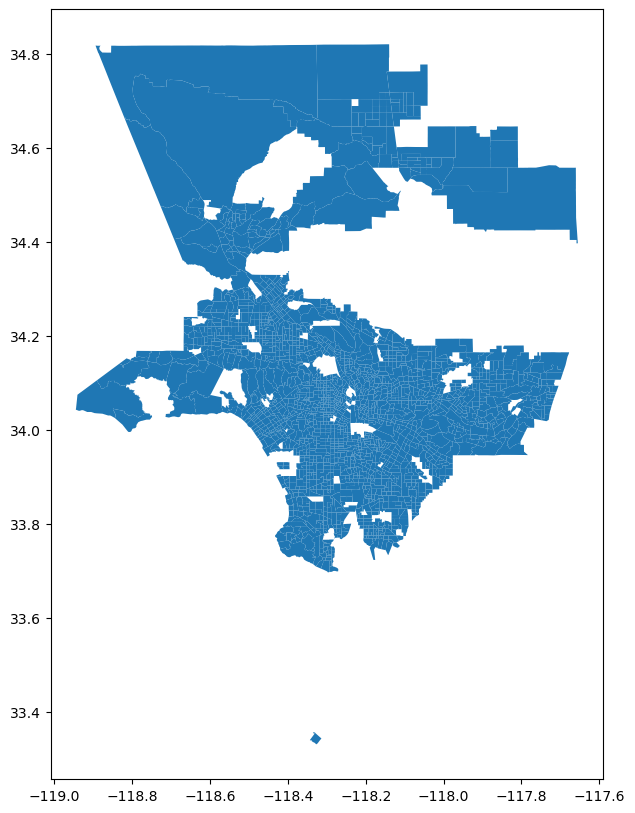

In [8]:
heat_merged.plot (figsize=(12,10))

To best understand the effects heat will have in the City of Los Angeles, we must first understand the projected outcomes. The California Healthy Places Index Heat Edition[^1] was developed by the Public Health Alliance of Southern California in partnership with the UCLA Luskin Center for Innovation. This tool projects exposure to heat in terms of days above 90F and/or 100F between the years 2035-2064 and beyond. The base map derives from the Healthy Places Index which utilizes place-based indicators to determine potential environemtnal variables that could affect public health and assigning a helath index to each location. 

For the purpose of this notebook, we will look at days above 90F between the years 2035-2064. The following map projects which Census tracts will experience extreme days in the future. Similar to the previous map, this one includes a color scheme to quanitfy the number of heat days that will be experienced across the County. This map shows the radial effect from this phenomenon. We can begin to see that areas closer to the coast are cooler than those in arid regions. The reason for this effect could be that the geomorphic topography of the Los Angeles region retains heat naturally. The County and the City of Los Angeles are part of the geologic Los Angeles Basin which naturally serves as a heatsink for the region, but most of the area is located on the windward side of the Santa Monica Mountains. As prevailing winds push cold air across the region, this air heats up the further away from the ocean and as it crosses the mountains, it becomes wartmer and drier leading to increased heat on the Leeward side which includes the San Fernando Valley. However, this data set must be cut down to the City level to understand the efforts of local environmental planning to mitgate the effects of heat. In the following map, we explore the same data, but at the City scale

[^1]https://heat.healthyplacesindex.org/

In [9]:
heat_merged.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

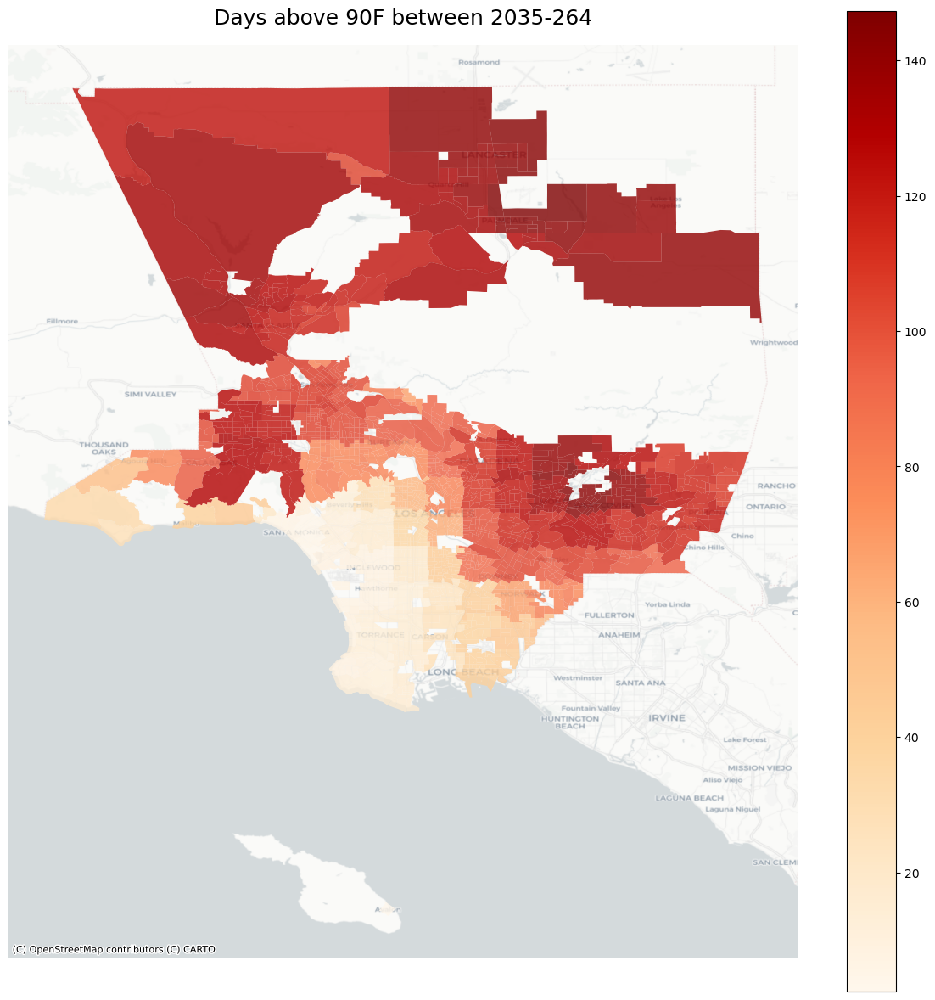

In [10]:
fig,ax = plt.subplots(figsize=(15,15))
heat_merged.plot(ax=ax,
        column='heat_days', # this defines the field to "choropleth"
        legend=True,
        alpha=0.8,
        cmap='OrRd') # the "_r" reverses the color               
ax.axis('off')
ax.set_title('Days above 90F between 2035-264',fontsize=18,pad=18)
ctx.add_basemap(ax,
                source=ctx.providers.CartoDB.Positron,
                crs=4326, 
                zoom=10)

In [11]:
heat_merged['heat_days']=heat_merged['heat_days'].astype(int)
heat_merged.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 2261 entries, 0 to 2260
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   GEOID       2261 non-null   object  
 1   geometry    2261 non-null   geometry
 2   Tract       2261 non-null   float64 
 3   heat_days   2261 non-null   int64   
 4   FIPS        2261 non-null   object  
 5   heat_bin    2261 non-null   int64   
 6   heat_label  2261 non-null   object  
dtypes: float64(1), geometry(1), int64(2), object(3)
memory usage: 141.3+ KB


In [12]:
city=gpd.read_file('City_Boundary.geojson')

In [13]:
heat_clip=gpd.clip(heat_merged,city)

/opt/conda/lib/python3.10/site-packages/geopandas/tools/clip.py:67: FutureWarning: In a future version, `df.iloc[:, i] = newvals` will attempt to set the values inplace instead of always setting a new array. To retain the old behavior, use either `df[df.columns[i]] = newvals` or, if columns are non-unique, `df.isetitem(i, newvals)`
  clipped.loc[


In [14]:
heat_clip.to_csv('Heat Data.csv', index=False)

In [15]:
heat_clip.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 1113 entries, 1335 to 450
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   GEOID       1113 non-null   object  
 1   geometry    1113 non-null   geometry
 2   Tract       1113 non-null   float64 
 3   heat_days   1113 non-null   int64   
 4   FIPS        1113 non-null   object  
 5   heat_bin    1113 non-null   int64   
 6   heat_label  1113 non-null   object  
dtypes: float64(1), geometry(1), int64(2), object(3)
memory usage: 69.6+ KB


In [16]:
bins=([0,25,50,75,100,125,150])

In [17]:
m=folium.Map(location=[34,-118.3], 
               zoom_start = 9.5,
               tiles='CartoDB positron', 
               attribution='CartoDB')

style1 = {'fillOpacity':'0.0', 
          'stroke':True,
          'weight':'3'}

folium.GeoJson('City_Boundary.geojson',   
               highlight_function=None, 
               style_function=lambda x:style1,
               name="City", 
               overlay=True, 
               control=True, 
               show=False, 
               smooth_factor=None, 
               tooltip=None, 
               embed=True, 
               popup=None, 
               zoom_on_click=True, 
               marker=None
              ).add_to(m)

folium.Choropleth(geo_data=heat_clip, 
                  data=heat_clip,           
                  key_on='feature.properties.GEOID', 
                  columns=['GEOID', 'heat_days'],
                  fill_color='YlOrRd',
                  line_weight=0.8, 
                  fill_opacity=1.0,
                  line_opacity=0.4, 
                  legend_name='Heat Days above 90F between 2035-2064',
                  name='Heat Days', 
                  bins=bins,
                  reset=True,
).add_to(m)  

folium.LayerControl().add_to(m)
m

After using the folium library, we create a more interactive map which shows the same story we saw in the previous map. This time we can observe that the warmest areas will be the valley and eastern regions of the City. The leading theory for the increased heat retention and experience is known as the urban heat island effect. Cities tend to be hotter and occurs when cities replace natural land cover with dense concentrations of pavement, buildings, and other surfaces that absorb and retain heat. However, this data set does not show the density of buildings in the given region. Althought that is not the purpose of this study, we can begin to see what areas will be experiencing more heat over the next 40 years. In our other notebooks we explore how demographics could intensify the effects of heat even more. Although heat is dispersed objectively throughout the City, there are subjective variables such as race, redlining, and other variabels that affcet this outcome. To understand the potnetial dnagers this poses to those communtiies our other notebooks explore that information. 

In [18]:
m.save('Heat In LA.html')

In [19]:
heat_sorted=heat_clip.sort_values(by='heat_days',ascending = False)
print(heat_sorted)

            GEOID                                           geometry    Tract  \
915   06037134901  POLYGON ((-118.56992 34.19051, -118.56939 34.1...  1349.01   
762   06037134904  POLYGON ((-118.58795 34.19524, -118.58758 34.1...  1349.04   
916   06037135111  POLYGON ((-118.61367 34.19816, -118.61158 34.1...  1351.11   
1447  06037134905  POLYGON ((-118.59280 34.18835, -118.59061 34.1...  1349.05   
1096  06037135201  POLYGON ((-118.63204 34.17968, -118.63199 34.1...  1352.01   
917   06037135102  POLYGON ((-118.62303 34.19750, -118.62176 34.1...  1351.02   
1600  06037135114  POLYGON ((-118.61444 34.18645, -118.61249 34.1...  1351.14   
22    06037137504  POLYGON ((-118.58099 34.14334, -118.58090 34.1...  1375.04   
32    06037139301  POLYGON ((-118.57148 34.17772, -118.57146 34.1...  1393.01   
767   06037139402  POLYGON ((-118.56563 34.17058, -118.56549 34.1...  1394.02   
13    06037137501  POLYGON ((-118.58826 34.16639, -118.58815 34.1...  1375.01   
617   06037139802  POLYGON (

In [20]:
top_heat=heat_sorted.head(10)
print(top_heat)

            GEOID                                           geometry    Tract  \
915   06037134901  POLYGON ((-118.56992 34.19051, -118.56939 34.1...  1349.01   
762   06037134904  POLYGON ((-118.58795 34.19524, -118.58758 34.1...  1349.04   
916   06037135111  POLYGON ((-118.61367 34.19816, -118.61158 34.1...  1351.11   
1447  06037134905  POLYGON ((-118.59280 34.18835, -118.59061 34.1...  1349.05   
1096  06037135201  POLYGON ((-118.63204 34.17968, -118.63199 34.1...  1352.01   
917   06037135102  POLYGON ((-118.62303 34.19750, -118.62176 34.1...  1351.02   
1600  06037135114  POLYGON ((-118.61444 34.18645, -118.61249 34.1...  1351.14   
22    06037137504  POLYGON ((-118.58099 34.14334, -118.58090 34.1...  1375.04   
32    06037139301  POLYGON ((-118.57148 34.17772, -118.57146 34.1...  1393.01   
767   06037139402  POLYGON ((-118.56563 34.17058, -118.56549 34.1...  1394.02   

      heat_days        FIPS  heat_bin heat_label  
915         133  6037134901         6    125-150  
762   

In [21]:
top_heat['Neighborhood']=np.array(['Woodland Hills',
                          'Winnetka',
                          'Canoga Park',
                          'Pierce College',
                          'West Hills',
                          'Northern Canoga Park',
                          'Southern Canoga Park',
                          'Tarzana',
                          'West Tarzana',
                          'Southern Tarzana'])
print(top_heat)

            GEOID                                           geometry    Tract  \
915   06037134901  POLYGON ((-118.56992 34.19051, -118.56939 34.1...  1349.01   
762   06037134904  POLYGON ((-118.58795 34.19524, -118.58758 34.1...  1349.04   
916   06037135111  POLYGON ((-118.61367 34.19816, -118.61158 34.1...  1351.11   
1447  06037134905  POLYGON ((-118.59280 34.18835, -118.59061 34.1...  1349.05   
1096  06037135201  POLYGON ((-118.63204 34.17968, -118.63199 34.1...  1352.01   
917   06037135102  POLYGON ((-118.62303 34.19750, -118.62176 34.1...  1351.02   
1600  06037135114  POLYGON ((-118.61444 34.18645, -118.61249 34.1...  1351.14   
22    06037137504  POLYGON ((-118.58099 34.14334, -118.58090 34.1...  1375.04   
32    06037139301  POLYGON ((-118.57148 34.17772, -118.57146 34.1...  1393.01   
767   06037139402  POLYGON ((-118.56563 34.17058, -118.56549 34.1...  1394.02   

      heat_days        FIPS  heat_bin heat_label          Neighborhood  
915         133  6037134901        

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


To get a better understanding of this intense heat I created bar graahs to see what areas will expereince the most and lowest heat days. First, we look at how many census tracts in the City of Los Angeles will experience days above 90F. Currently, there are 344 census tracts that will expereince at least 25 days above 90F. There are also 316 census tracts that will expeirnce 100 days and above of 90F or higher duirng the years 2035-2064. Having 316 tracts above 100 days of extreme heat poses a serious public health risk for the City and with poor mitgation efforts this can pose an extreme threat to those most vulnerable. 

In [22]:
set1=heat_clip['heat_label'].value_counts()
set1.reset_index()
set1

less tha 25    344
100-124        251
25-49          170
75-99          161
50-74          123
125-150         64
Name: heat_label, dtype: int64

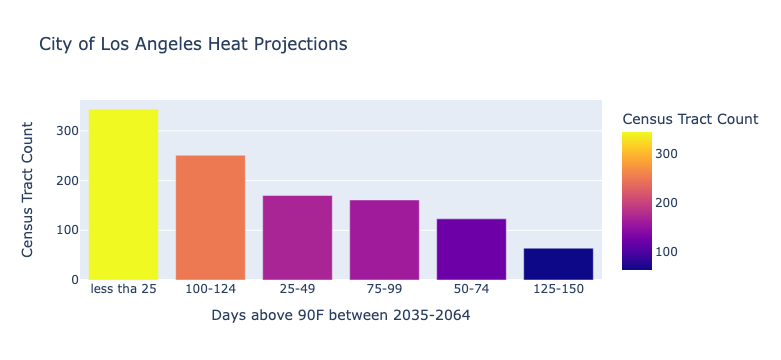

In [23]:
fig3=px.bar(set1,
           color="value",
           labels={
                     "value": "Census Tract Count",
                     "index": "Days above 90F between 2035-2064"
                 },
            title="City of Los Angeles Heat Projections")
fig3.show()

In [24]:
fig3.write_html('Heat_Bin.html')

Next, we observe the census tracts witht he highest number of days above 90F. There are at least 10 census tracts that will experience at least 133 to 130 days above 90F. The neighborhood with the most days is Woodland Hills, which is within the San Fernando Valley and known for its lack of vegetative cover. This area is also rapidly devolping with new projects planned to bring in a soccer stadium and more luxary apartments.The neighborhoods in the City with the lowest expected heat days is Venice and the coastal regions. These areas will experience at most 3 to 4 days above 90F. This really illustrates the variation among heat across the overall city and especially in arid regions with very little shade. Although this inital observation shows how extreme heat can be, there are other variables to consider. Certain communities are more vulnerable to heat and will experience the personal health effects differently across the city. 

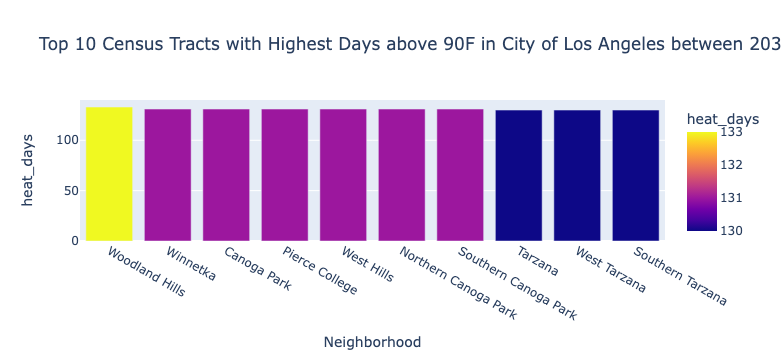

In [25]:
fig1=px.bar(top_heat,
            x='Neighborhood',
            y='heat_days',
            color='heat_days',
            title='Top 10 Census Tracts with Highest Days above 90F in City of Los Angeles between 2035 and 2064',
           )
fig1.show()

In [26]:
fig1.write_html('Top_heat.html')

In [27]:
low_heat=heat_sorted.tail(10)
print(low_heat)

            GEOID                                           geometry    Tract  \
1202  06037267402  POLYGON ((-118.47031 34.04180, -118.46965 34.0...  2674.02   
1994  06037267600  POLYGON ((-118.46060 34.03398, -118.45972 34.0...  2676.00   
122   06037267300  POLYGON ((-118.45385 34.04609, -118.45289 34.0...  2673.00   
704   06037273902  POLYGON ((-118.47136 33.98425, -118.47106 33.9...  2739.02   
1938  06037274100  POLYGON ((-118.45856 33.98797, -118.45804 33.9...  2741.00   
2081  06037273600  POLYGON ((-118.46574 33.99114, -118.46563 33.9...  2736.00   
583   06037273402  POLYGON ((-118.48334 33.99551, -118.48216 33.9...  2734.02   
703   06037273502  POLYGON ((-118.47671 33.98745, -118.47504 33.9...  2735.02   
1937  06037273800  POLYGON ((-118.45962 33.99043, -118.45880 33.9...  2738.00   
1551  06037274202  POLYGON ((-118.46683 33.97905, -118.46654 33.9...  2742.02   

      heat_days        FIPS  heat_bin   heat_label  
1202          4  6037267402         1  less tha 25  
19

In [28]:
low_heat['Neighborhood']=np.array(['West Los Angeles',
                          'Sawtelle',
                          'West Los Angeles',
                          'West Venice',
                          'Venice/Marina Del Rey',
                          'Venice/Oakwood',
                          'Vencie Beach',
                          'South Venice',
                          'Southwest Venice',
                          'Marina Del Rey'])
print(low_heat)

            GEOID                                           geometry    Tract  \
1202  06037267402  POLYGON ((-118.47031 34.04180, -118.46965 34.0...  2674.02   
1994  06037267600  POLYGON ((-118.46060 34.03398, -118.45972 34.0...  2676.00   
122   06037267300  POLYGON ((-118.45385 34.04609, -118.45289 34.0...  2673.00   
704   06037273902  POLYGON ((-118.47136 33.98425, -118.47106 33.9...  2739.02   
1938  06037274100  POLYGON ((-118.45856 33.98797, -118.45804 33.9...  2741.00   
2081  06037273600  POLYGON ((-118.46574 33.99114, -118.46563 33.9...  2736.00   
583   06037273402  POLYGON ((-118.48334 33.99551, -118.48216 33.9...  2734.02   
703   06037273502  POLYGON ((-118.47671 33.98745, -118.47504 33.9...  2735.02   
1937  06037273800  POLYGON ((-118.45962 33.99043, -118.45880 33.9...  2738.00   
1551  06037274202  POLYGON ((-118.46683 33.97905, -118.46654 33.9...  2742.02   

      heat_days        FIPS  heat_bin   heat_label           Neighborhood  
1202          4  6037267402     

/opt/conda/lib/python3.10/site-packages/geopandas/geodataframe.py:1443: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



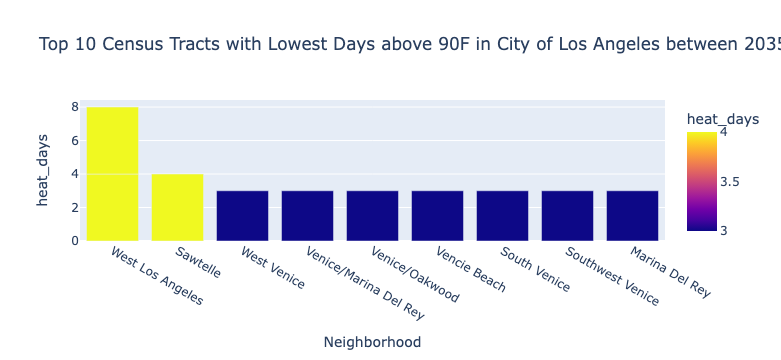

In [29]:
fig2=px.bar(low_heat,
            x='Neighborhood',
            y='heat_days',
            title='Top 10 Census Tracts with Lowest Days above 90F in City of Los Angeles between 2035 and 2064',
           color='heat_days')
fig2.show()

In [30]:
heatlist=heat_clip['heat_bin'].unique().tolist()
heatlist

[1, 2, 3, 6, 5, 4]

In [31]:
labellist=heat_clip['heat_label'].unique().tolist()
labellist

['less tha 25', '25-49', '50-74', '125-150', '100-124', '75-99']

In [32]:
fig2.write_html('Heat_Low.html')

Finally, we create a loop to geographically demonstarte which areas will be impacted based on intervals of 25 days. This loop gives us a better opportunity to see indivually the areas that will be affected. As seen before, the coastal regions wille experience the coolest years. This is primarily due to the prevailing winds as mentioned above. However, this loop also shows that the eastern areas of the City such as Eagle Rock, East LA, Boyle Heights, etc. will experience at least 50-99 days above 90F. Although this seems minor, these tracts are known for their vulnerable communities. That is why it is important to understand how many reosources exist in these communities and what they lack to helplan for resilience. Our team can now overlay this data on these maps and especially since we can analayze this project as a spatial problem.

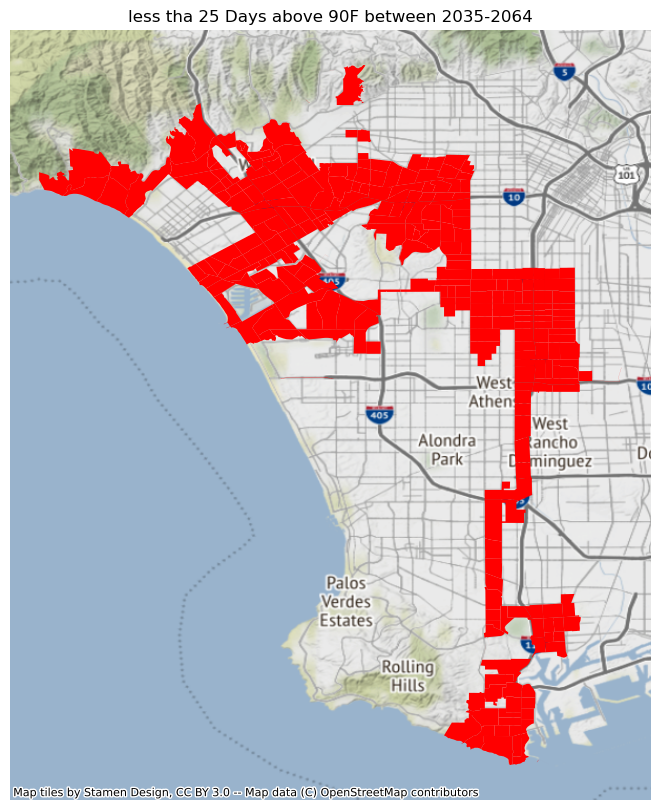

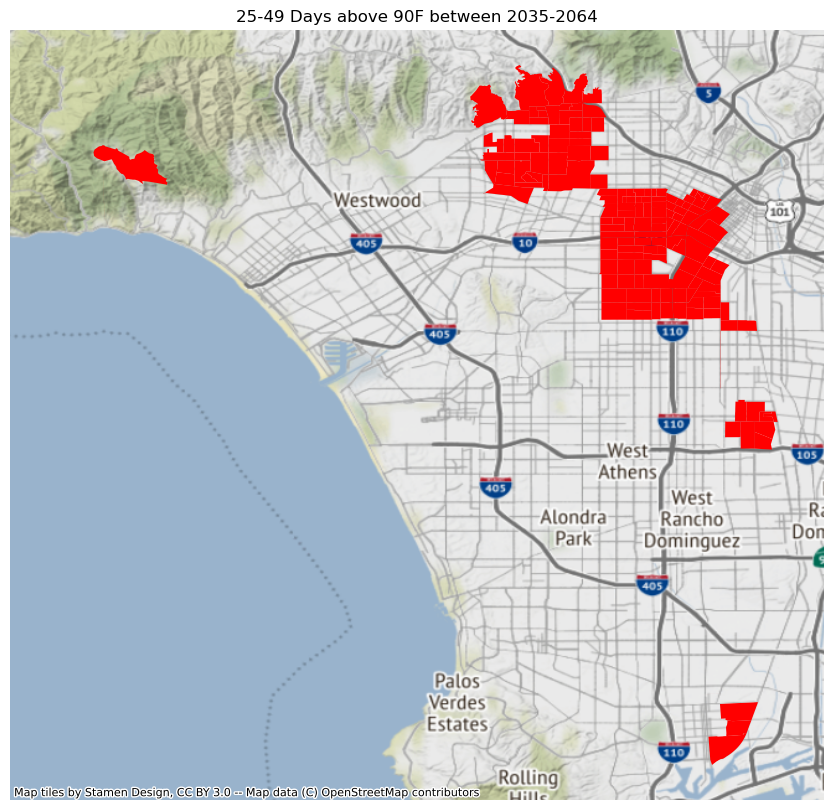

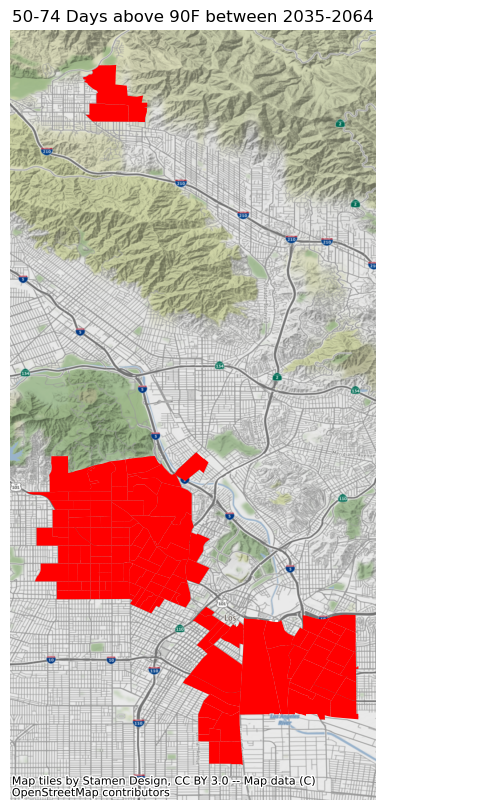

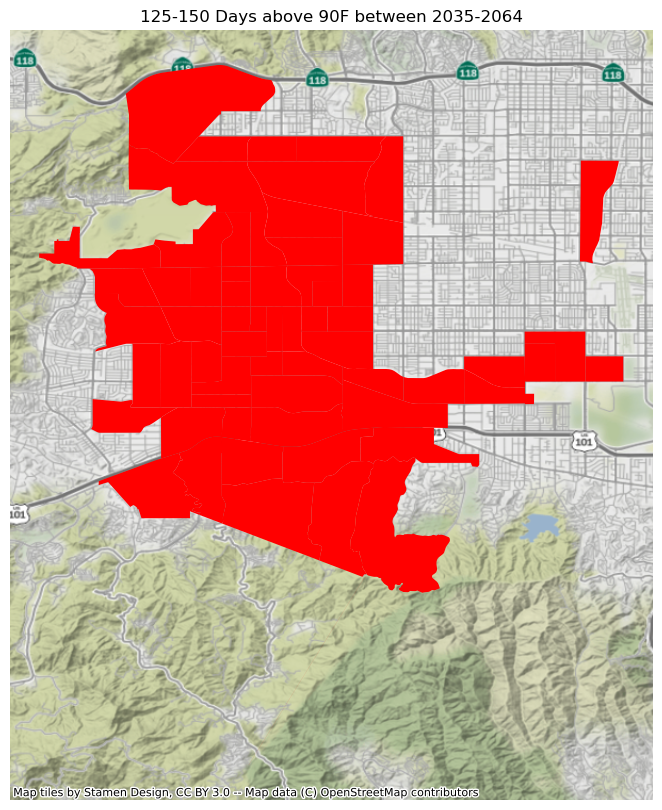

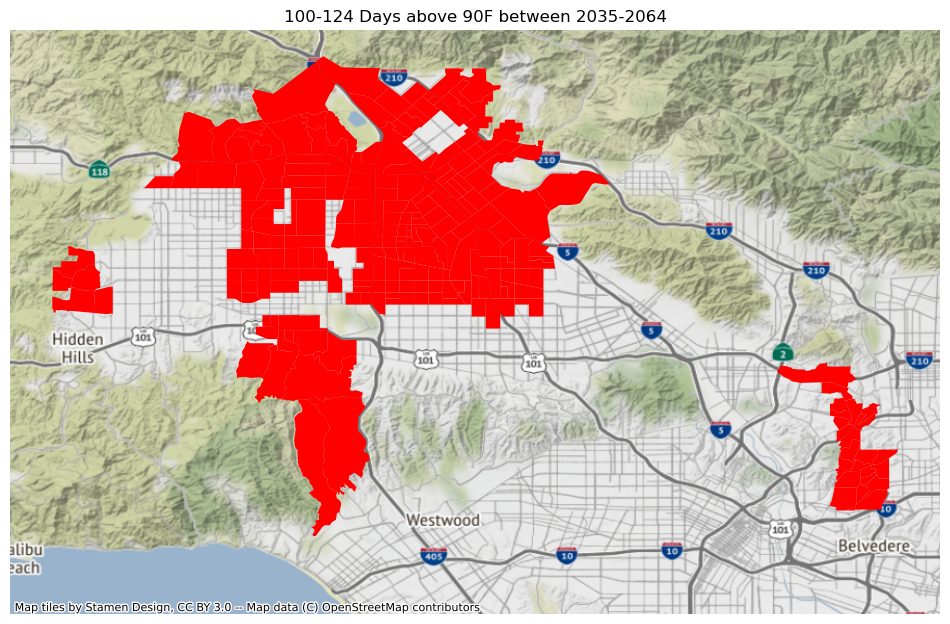

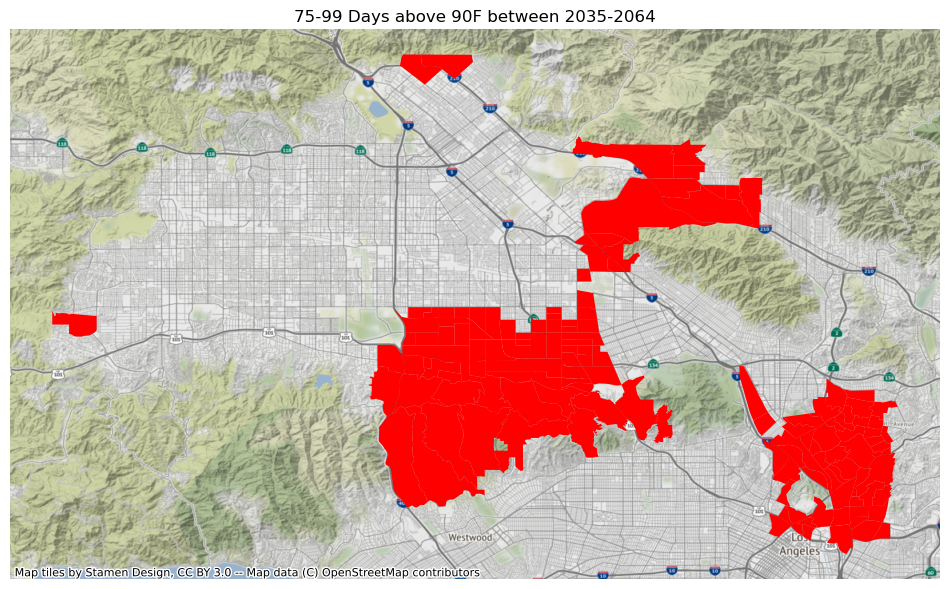

In [38]:
for type in labellist:

    fig, ax = plt.subplots(figsize=(12,10))
    
    heat_clip[heat_clip['heat_label'] == type].plot(ax=ax,
                                              color='red')
    ax.axis('off')
    
    ax.set_title(type+ ' ' + 'Days above 90F between 2035-2064')
    
    ctx.add_basemap(ax, crs=4326)